In [1]:
# Note: some of the code are copied from Kaggle's lessons

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from scipy import signal
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        pass

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor

from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import lightgbm as lgb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
# Files 
GSPC_path='./data/^GSPC.csv'
can_unemp_path='./data/can_unempemp.csv'
us_unemp_path='./data/us_UNRATE.csv'
DJI_path='./data/^DJI.csv'
FVX_path='./data/^FVX.csv'
GSPTSE_path='./data/^GSPTSE.csv'
IRX_path='./data/^IRX.csv'
IXIC_path='./data/^IXIC.csv'
N225_path='./data/^N225.csv'
TNX_path='./data/^TNX.csv'
TYX_path='./data/^TYX.csv'
usGDP_path='./data/usGDP.csv'
non_farm_path='./data/non_farm.csv'
us_CPI_path='./data/OECD_CPI_Total_All_Items.csv'

In [4]:
GSPC = pd.read_csv(GSPC_path, index_col='Date',parse_dates=True)
can_unemp = pd.read_csv(can_unemp_path, index_col='Date',parse_dates=True)
us_unemp = pd.read_csv(us_unemp_path, index_col='DATE',parse_dates=True)

DJI = pd.read_csv(DJI_path, index_col='Date',parse_dates=True)
FVX = pd.read_csv(FVX_path, index_col='Date',parse_dates=True)
GSPTSE = pd.read_csv(GSPTSE_path, index_col='Date',parse_dates=True)
IRX = pd.read_csv(IRX_path, index_col='Date',parse_dates=True)
IXIC = pd.read_csv(IXIC_path, index_col='Date',parse_dates=True)
N225 = pd.read_csv(N225_path, index_col='Date',parse_dates=True)
TNX = pd.read_csv(TNX_path, index_col='Date',parse_dates=True)
TYX = pd.read_csv(TYX_path, index_col='Date',parse_dates=True)

usGDP = pd.read_csv(usGDP_path, index_col='DATE',parse_dates=True)
non_farm = pd.read_csv(non_farm_path, index_col='DATE',parse_dates=True)
us_CPI = pd.read_csv(us_CPI_path, index_col='DATE',parse_dates=True)


In [5]:
def stock_use_close_value(df):
    headers_to_drop=['Open', 'High','Low','Adj Close','test','Volume']
    current_cols=df.columns
#     df['Close-Open']=df['Close']-df['Open']
    for header in headers_to_drop:
        if header in current_cols:
            df=df.drop(columns = header)
    if 'Close' in current_cols:
        pass
#         df['Close']=df['Close'].apply(np.log)
    return df


def data_prepare(df,name):
    df=df.dropna()
    df=df.resample('D').interpolate(method='cubic') #TODO: possible data leak
    
    for col in df.columns:
        df=df.rename(columns={col : (name+'_'+col)})
    return df


In [6]:
GSPC=data_prepare(stock_use_close_value(GSPC),'GSPC')
can_unemp=data_prepare(can_unemp,'can_unemp')
us_unemp=data_prepare(us_unemp,'us_unemp')

DJI=data_prepare(stock_use_close_value(DJI),'DJI')
FVX=data_prepare(stock_use_close_value(FVX),'FVX')
GSPTSE=data_prepare(stock_use_close_value(GSPTSE),'GSPTSE')
IRX=data_prepare(stock_use_close_value(IRX),'IRX')
IXIC=data_prepare(stock_use_close_value(IXIC),'IXIC')
N225=data_prepare(stock_use_close_value(N225),'N225')
TNX=data_prepare(stock_use_close_value(TNX),'TNX')
TYX=data_prepare(stock_use_close_value(TYX),'TYX')

usGDP=data_prepare(usGDP,'usGDP')
non_farm=data_prepare(non_farm,'non_farm')
us_CPI=data_prepare(us_CPI,'us_CPI')




econ_data_ori=GSPC.copy()
# econ_data_ori=econ_data_ori.join(can_unemp)
econ_data_ori=econ_data_ori.join(us_unemp)
econ_data_ori=econ_data_ori.join(DJI)
# econ_data_ori=econ_data_ori.join(FVX)
# econ_data_ori=econ_data_ori.join(GSPTSE)
# econ_data_ori=econ_data_ori.join(IRX)
# econ_data_ori=econ_data_ori.join(IXIC)
econ_data_ori=econ_data_ori.join(N225)
# econ_data_ori=econ_data_ori.join(TNX)
# econ_data_ori=econ_data_ori.join(TYX)


# econ_data_ori=econ_data_ori.join(usGDP)
# econ_data_ori=econ_data_ori.join(non_farm)
# econ_data_ori=econ_data_ori.join(us_CPI)


current_time_features=econ_data_ori.columns
econ_data_ori

,GSPC_Close,us_unemp_UNRATE,DJI_Close,N225_Close
Date,,,,
1950-01-03,16.660000,6.484862,NaN,NaN
1950-01-04,16.850000,6.477920,NaN,NaN
1950-01-05,16.930000,6.471378,NaN,NaN
1950-01-06,16.980000,6.465225,NaN,NaN
1950-01-07,17.048521,6.459447,NaN,NaN
...,...,...,...,...
2019-09-13,3007.389893,NaN,27219.519531,21988.289063
2019-09-14,3002.211764,NaN,27195.178014,22239.241389
2019-09-15,2997.932843,NaN,27126.278833,22400.024966


In [7]:

def rolling_mean(series,duration):
    return (series.rolling(duration, win_type='blackman').mean())

def rolling_pstd(series,duration):
    cat = lambda x: (x - x.mean()) / x.std()   
    series=series.dropna()
    series=series.replace([np.inf, -np.inf], np.nan).fillna(series.mean())
    return (series.rolling(duration).std()/series*100).replace([np.inf, -np.inf], np.nan).fillna(series.mean())


def sp_cat(x):
    if (x > 4.0):
        return 2

    if (x> 1.0):
        return 1

    if (x > -1.0):
        return 0

    if (x >-4.0):
        return -1

    if (x <-4.0):
        return -2



def smooth_data(df, features_to_smooth, tap=10):
    for col in features_to_smooth:
        df[col+'_smoothed']=rolling_mean(df[col],tap).shift(periods=int(-tap/2))
    return df

def trend_predict(series, target_distance, sampling_period=30, order=1):
    
    series=series.dropna()
    
    list_of_values_in_window = []
    series.rolling(sampling_period).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
    slopes=[]
    for arr in list_of_values_in_window:
        simple_fit = (np.polyfit(range(sampling_period), arr, order))
        poly_func = np.poly1d(simple_fit)
        pred=poly_func(target_distance-1+sampling_period)
        slopes.append(pred)

    pred_series=pd.Series(slopes, (series.index[:1-sampling_period]))
    
    return pred_series
    
def inverted_in_past_duration(series_high,series_low,duration):
    series=series_high-series_low
    def min_is_negative (arr):
        min_val=np.min(arr)
        if min_val<=0:
            return 1
        else: return 0
    return (series.rolling(duration).apply(min_is_negative))

    
    return pred_series
def trendline(series, tap, name='slopes', order=1):
    series=series.dropna()
    series=series[series.notna()]
    start_date=series.first_valid_index()
    end_date=series.last_valid_index()

    series=series[series.index>=start_date]
    series=series[series.index<=end_date]
    
    list_of_values_in_window = []
    series.rolling(tap).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
      
    slopes = [(np.polyfit(range(tap), arr, order))[-2] for arr in list_of_values_in_window]

    slopes_series=pd.Series(slopes, (series.index[tap-1:]))

    return slopes_series

def stock_utility(series_list, name_list=[], delay_days=[],trendline_days=[], std_days=[]):
    df = pd.DataFrame()
    if not isinstance(series_list, pd.DataFrame):
        col_list=[0]
        series_list=[series_list]
    else:
        col_list= series_list.columns
        
    if not isinstance(name_list, list):
        name_list=[name_list]    
        
    if not isinstance(trendline_days, list):
        trendline_days=[trendline_days]  
        
    if not isinstance(std_days, list):
        std_days=[std_days]  
    
    
    for i in range(len(col_list)):
        series=series_list[col_list[i]].dropna()
        if i >= len(name_list):
            name = series.name
        else:
            name=name_list[i]
        print('stock_utility is working on '+name)
        
        for dd in delay_days:
            df[name+'_'+str(dd)+'d']=series.shift(periods=dd)

        for td in trendline_days:
            series_name=name+'_'+str(td)+'days_trendline'
            df[series_name]=trendline(series,td,series_name)

        for sd in std_days:
            series_name=name+'_'+str(sd)+'days_pSTD'
            df[series_name]=rolling_pstd(series,sd)

    return df

def poly_extrapolate (df,target_distance, sampling_period=[30], order=1):
    new_df = pd.DataFrame()
    if not isinstance(df, pd.DataFrame):
        col_list=[0]
        df=[df]
    else:
        col_list= df.columns
        
    if not isinstance(sampling_period, list):
        sampling_period=[sampling_period]  
        
    
    for i in range(len(col_list)):
        series=df[col_list[i]].dropna()
        name = series.name
        target_distance=[int(s) for s in str(name).replace('days','').replace('d','').split('_') if s.isdigit()][-1]
        print('extrapolating '+name)

        for sp in sampling_period:
            series_name=name+'_'+str(sp)+'days_'+str(order)+'order_extrapolated'
            new_df[series_name]=trend_predict(series, target_distance, sp, order)            

    return new_df

def p_diff_err (ref_series,diff_series):
    result=(abs(diff_series-ref_series)/ref_series).dropna().values.mean()*100
    print ('The absolut error is {:.3f}%'.format(result))
    return result

def diff_err_scorer (ref_series,diff_series):
    result=(((100*abs(diff_series-ref_series)/ref_series)**3)).dropna().values.mean()
    result=result**(0.5)
    print ('The custom error is {:.3f}'.format(result))
    return result

def normalize_stock (df,target_days,additional_features =[] ,key_word="Close", negative_keyword='STD'):
    features_to_norm = [f for f in df.columns if (key_word in f and negative_keyword not in f)]
    features_to_norm =list(features_to_norm) + additional_features
    features_to_norm = list(dict.fromkeys(features_to_norm))
    normed_features = [feature +'_'+str(target_days)+'days_ratio' for feature in features_to_norm]
    df[normed_features]=((df[features_to_norm]/df[features_to_norm].shift(periods=target_days))-1)*100
    return df

In [8]:
def data_init_wrapper (df, target_days, important_features=['GSPC_Close']):
    new_df= df.copy()
    ori_features=df.columns
    smoothed_features = [f for f in list(ori_features) if "smoothed" in f]
    not_important_std_features = [f for f in list(ori_features) if f not in (smoothed_features + important_features)]
    important_std_features = [f for f in list(ori_features) if (f not in smoothed_features and f in important_features)]
    print('not_important_std_features='+str(not_important_std_features))
    print('important_std_features='+str(important_std_features))
    
#     remove not smooth or not std features
    features_to_drop=[f for f in list(new_df.columns) if (("smoothed" not in f) and ("STD" not in f))]
    new_df=new_df.drop(columns=features_to_drop)

    target='GSPC_Close_smoothed_'+str(target_days)+'days_ratio'
    
    important_features.append(target)
    important_features=[f for f in important_features if f not in features_to_drop]
    
    additional_features_to_normalize=[]
    if 'non_farm_non_Farm_smoothed' in ori_features:
        additional_features_to_normalize.append('non_farm_non_Farm_smoothed')
    if 'usGDP_usGDP_smoothed' in ori_features:
        additional_features_to_normalize.append('usGDP_usGDP_smoothed')
    
    new_df=normalize_stock(new_df, target_days, additional_features=additional_features_to_normalize)

    trendline_features=list(new_df.columns)
    
    not_important_trendline_features=[f for f in list(trendline_features) if f not in (important_features)]
    important_trendline_features=[f for f in list(trendline_features) if f in (important_features)]
    
    new_df=new_df.join( stock_utility(new_df[not_important_trendline_features],trendline_days=[target_days]) )
    
    new_df=new_df.join(stock_utility(new_df[important_trendline_features],trendline_days=[target_days]))
    
    features_to_delay=list(new_df.columns)
    features_to_delay.remove(target)   
    
    output_df=stock_utility(new_df,delay_days=[target_days])
    
    features_to_add_extrapolation=[f for f in list(output_df.columns) if ('trendline' not in f)]
    
    order1_extrapolation=(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=1))
    output_df=output_df.join(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=2))
    output_df=output_df.join(order1_extrapolation)
    
    output_df=output_df.join(new_df[target])
    

    return output_df

In [9]:
econ_data=econ_data_ori.copy()
econ_data.name='econ_data'
prediction_distance=30

econ_data_file_path=econ_data.name+str(prediction_distance)+'.csv'
if not os.path.isfile(econ_data_file_path):
    # Add features
    econ_data=smooth_data(econ_data,current_time_features,prediction_distance)

    econ_data_processed = data_init_wrapper(econ_data, prediction_distance)
    econ_data=econ_data_processed
    
    econ_data.to_csv(econ_data_file_path)
else:
    econ_data = pd.read_csv(econ_data_file_path)
    econ_data["Date"]=pd.to_datetime(econ_data["Date"])
    econ_data=econ_data.set_index("Date").dropna()

target='GSPC_Close_smoothed_'+str(prediction_distance)+'days_ratio'



In [10]:
start_date=max(econ_data.apply(lambda series: series.first_valid_index()))
end_date=min(econ_data.apply(lambda series: series.last_valid_index()))

econ_data=econ_data[econ_data.index>=start_date]
econ_data=econ_data[econ_data.index<=end_date]

# econ_data.drop(index=pd.to_datetime('1950-01-03'))
econ_data

,GSPC_Close_smoothed_30d,us_unemp_UNRATE_smoothed_30d,DJI_Close_smoothed_30d,N225_Close_smoothed_30d,GSPC_Close_smoothed_30days_ratio_30d,DJI_Close_smoothed_30days_ratio_30d,N225_Close_smoothed_30days_ratio_30d,GSPC_Close_smoothed_30days_trendline_30d,us_unemp_UNRATE_smoothed_30days_trendline_30d,DJI_Close_smoothed_30days_trendline_30d,...,DJI_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,GSPC_Close_smoothed_30d_30days_1order_extrapolated,us_unemp_UNRATE_smoothed_30d_30days_1order_extrapolated,DJI_Close_smoothed_30d_30days_1order_extrapolated,N225_Close_smoothed_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,DJI_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio
Date,,,,,,,,,,,,,,,,,,,,,
1985-05-12,180.135630,7.258506,1263.432438,12504.594130,1.084040,0.159876,0.663794,0.075174,0.000083,0.108545,...,4.367559,16.699373,184.197018,7.194505,1253.214839,12592.193215,0.980376,-1.049333,-1.519984,2.417418
1985-05-13,180.310349,7.254004,1264.235975,12474.547361,1.267848,0.332210,0.327173,0.075135,-0.000263,0.109952,...,7.567461,15.826054,184.948707,7.213037,1256.649011,12649.534056,1.342346,-0.806145,-0.683113,2.618438
1985-05-14,180.484143,7.249466,1265.064009,12442.258137,1.418733,0.472873,-0.037297,0.074569,-0.000607,0.108356,...,10.495903,14.989269,185.835453,7.232582,1261.086314,12699.449690,1.792612,-0.471236,0.158284,2.810354
1985-05-15,180.649737,7.244937,1265.878303,12409.198008,1.532861,0.578870,-0.411659,0.073692,-0.000947,0.105797,...,13.075423,14.329897,186.844400,7.252997,1266.475189,12741.077852,2.318908,-0.055157,0.994135,2.991489
1985-05-16,180.801631,7.240457,1266.647022,12377.073663,1.609080,0.650003,-0.776609,0.072692,-0.001279,0.104088,...,15.250301,13.952044,187.957621,7.274138,1272.741193,12774.060282,2.906913,0.430102,1.815814,3.159806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-06-14,2850.388563,3.651233,25697.084984,21288.516373,-1.838279,-2.784759,-3.547604,-2.058964,0.002837,-30.062312,...,40.628076,35.534528,2873.086030,3.780235,26008.649793,20474.697417,1.409297,3.462181,-1.412919,1.577011
2019-06-15,2847.794929,3.654743,25681.505533,21265.827790,-1.976097,-2.909168,-3.791328,-2.427807,0.002937,-32.666607,...,42.177359,37.681412,2898.530185,3.776408,26228.911532,20587.819032,2.937690,4.899860,0.032666,1.856410
2019-06-16,2845.555063,3.658209,25670.003821,21249.163202,-2.107802,-3.015386,-3.992732,-2.774381,0.003026,-34.884723,...,42.733482,38.843786,2924.080189,3.772366,26452.939665,20704.603112,4.450287,6.299449,1.421672,2.116534


In [11]:
econ_data=econ_data.dropna()
# econ_data=econ_data.astype(np.float32)

valid_fraction = 0.1
valid_size = int(len(econ_data) * valid_fraction)

# valid_size=365

# train = econ_data[:-1* 365]
# valid = econ_data[-365:]

econ_data=econ_data.round(10)
econ_data.fillna(0)
econ_data=econ_data.replace(np.inf, 1e10)
econ_data=econ_data.replace(-np.inf, -1e5)



for col in econ_data.columns:
    a = np.array(econ_data[col].values.tolist())
    econ_data[col] = np.where(a > 1e10, 1e10, a).tolist()
    


train = econ_data[:-2*valid_size]
valid = econ_data[-2 * valid_size:-valid_size]
test = econ_data[-valid_size:]

feature_cols = train.columns.drop(target)


X_train=train[feature_cols]
y_train=train[target]


X_valid=econ_data[-2 * valid_size:][feature_cols]
y_valid=econ_data[-2 * valid_size:][target]


X_val=valid[feature_cols]
y_val=valid[target]

X_test=test[feature_cols]
y_test=test[target]

In [12]:
def local_extrema (series, tap=30):
    
#     series=rolling_mean(series,tap)
    series=series.dropna()
    
    index_of_maxima=[]
    index_of_minima=[]
    take_derivative=1
    while take_derivative==1:
        try:
            derivative = trendline(series, tap)*1000
            take_derivative=0
        except:
            pass
        
        
    
    def find_intercept (x):
        arr=x
        if max(arr)>0.02 and min(arr)<-0.02:
            last_val=arr[0]
            last_i=arr.index[0]
            for current_val, i in zip(arr[1:], arr.index[1:]):
                if last_val >0 and current_val <= 0:
                    return (i.value)
                if last_val <0 and current_val >= 0:
                    return (i.value)
                last_val=current_val
                last_i=i
        return float("NaN")

    list_of_values_in_window = []
    extrema=derivative.rolling(tap).apply(find_intercept).dropna()
    
    extrema = pd.to_datetime(list(dict.fromkeys(list(extrema.values))))

    extrema = [extremum for extremum in extrema 
               if abs(1-(series[extremum]/series[(extremum-pd.Timedelta(days=tap/2)):(extremum+pd.Timedelta(days=tap/2))].mean()))>0.003]

    return pd.to_datetime(extrema)


def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60, soothing_period=15):
    
    def smother (date_series,soothing_period=soothing_period):
        date_series=date_series[pd.notnull(date_series)]
        day_diff=(date_series[1:]-date_series[:-1]).days
        index_days_too_close=[i for i in range(len(day_diff)) if day_diff[i]<=10 ]
        new_series = date_series
        for i in index_days_too_close:
            base_index=i
            while pd.isnull(new_series[base_index]):
                base_index=base_index-1
            new_series.values[base_index]=new_series[base_index]+(new_series[i+1]-new_series[base_index])/2
            new_series.values[i+1]=""
            
#         output=extrema_shifts_days.sort_index(axis=0)
#         output[pandas.notnull(output.values)]
        return new_series[pd.notnull(new_series)]
    ref_series_extrema=smother(ref_series_extrema)
    test_series_extrema=smother(test_series_extrema)
    extrema_shifts_days=pd.Series(dtype='float64')
    
    for extreme_date in ref_series_extrema:
        days_diff=([(extreme_date - test_extreme) for test_extreme in test_series_extrema])
        lowest_diff=days_diff[0]
#         print(days_diff)
        for diff in days_diff:
            if abs(diff)<abs(lowest_diff):
                lowest_diff=diff
        if abs(lowest_diff)<=pd.Timedelta(exclude_limit,'D'):
            extrema_shifts_days.at[extreme_date]=lowest_diff

    return extrema_shifts_days.sort_index(axis=0).dropna()


In [13]:
# arch=(14,14,14,7,7,7,5,5,5) # ~1.007/0.6008
# arch=(14,14,14,14,7,7,7,7,7,7,5,5) # ~0.662/1.10
# arch=(14,14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3) # ~0.619/0.824
arch=(14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3,3) # ~0.666/0.599

mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=arch).fit(X_train, y_train)
mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)

print('Train MAE:', mean_absolute_error(y_train, mlp_sklearn_model.predict(X_train)))
print('Valid MAE:', mlp_sklearn_score)


Train MAE: 0.6477031200255036
Valid MAE: 0.6667486399168836


In [14]:
# arch=[]
# max_width=28
# min_width=3
# width_step=2
# patience=3

# max_layers=30

# errs={}
# err_last_layer_num=1000

# for layer_num in range(1,max_layers+1):
#     layer_patience_level=patience+0
#     errs[layer_num]={}
#     print(f"working on layer {layer_num}....")
#     best_err=1000
#     best_width=0
#     current_patience_level=patience+0
#     for new_width in range(min_width,max_width+1,width_step):
#         current_arch=arch.copy()
#         current_arch.append(new_width)
#         current_arch=tuple(current_arch)
#         print(f"trying {current_arch}...")
#         mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=current_arch).fit(X_train, y_train)
#         mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
#         mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)
#         print(f"Got {mlp_sklearn_score} for {current_arch}")
        
#         errs[layer_num][new_width]=mlp_sklearn_score
        
#         if errs[layer_num][new_width]<best_err:
#             best_err=errs[layer_num][new_width]
#             best_width=new_width
            
#         else:
#             current_patience_level=current_patience_level-1
#         if current_patience_level<0:
#             print("ran out of patience, skipping...")
#             break
# #     best_err=1000
# #     best_width=0
# #     for width in errs[layer_num]:
# #         if errs[layer_num][width]<best_err:
# #             best_err=errs[layer_num][width]
# #             best_width=width
    
#     if best_err<=err_last_layer_num:
#         print(f"choose {best_width} as the width of layer {layer_num}")
#         print("\n")
#         arch.append(best_width)
#         err_last_layer_num=best_err
#     else:
#         layer_patience_level=layer_patience_level-1
#         if layer_patience_level<0:
#             print("ran out of patience, finishing...")
#             print(arch)
#             break



In [15]:
def adjust_slope (series):
    series=series-series[0]
    slope=series[-1]/len(series)
    for i in range(len(series)):
        series[i]=series[i]-i*slope
    return series

def local_extrema (series, tap=30, dist=30/2):
    series=adjust_slope(series)
    peaks, full_result = signal.find_peaks(series, height=(None, None),width=1,distance=dist)
    return pd.to_datetime(series.index[peaks])

def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60):
    ref_series_extrema=np.array(ref_series_extrema)
    test_series_extrema=np.array(test_series_extrema)
    
    closest_ind=abs(ref_series_extrema[:, None] - test_series_extrema[None, :]).argmin(axis=-1)
    
    out_obj={}
    
    for i in closest_ind:
        lowest_pos=abs(ref_series_extrema[closest_ind==i] - test_series_extrema[i]).argmin(axis=-1)
        lag=-1*(ref_series_extrema[closest_ind==i][lowest_pos]-test_series_extrema[i]) / np.timedelta64(1, 'D')
        if lag <= exclude_limit:
            out_obj[str(ref_series_extrema[closest_ind==i][lowest_pos])[:10]]=lag
            
    out_df=pd.Series(out_obj, name = 'Days Delayed').to_frame()
    print(f"The average delay around the peaks are {round(out_df['Days Delayed'].mean(),3)} days")
    print(f"The median delay around the peaks are {round(out_df['Days Delayed'].median(),3)} days")
    display(out_df)
    return out_df


def plot_results(model, X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    preds=model.predict(X_valid)
    
    return plot_preds_results(preds, y_valid, start_time=start_time, end_time=end_time,\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance)

def plot_preds_results(preds, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    valid_result=y_valid.to_frame()
    valid_result['preds']=preds

    plot_valid_result=valid_result

    plot_start_date= pd.to_datetime(start_time)
    plot_end_date= pd.to_datetime(end_time)

    plot_valid_result=plot_valid_result[plot_valid_result.index>=plot_start_date]
    plot_valid_result=plot_valid_result[plot_valid_result.index<=plot_end_date]


    sns.set_style("whitegrid")

    plt.figure(figsize=(11,8.5), dpi=600)

    sns.lineplot(data=plot_valid_result)

#     plt.show()


    plot_valid_result_new=plot_valid_result.copy()
    plot_valid_result_new['GSPC_Close_smoothed']=smooth_data(econ_data_ori,['GSPC_Close'],prediction_distance)['GSPC_Close_smoothed']
    plot_valid_result_new['GSPC_Close']=(econ_data_ori['GSPC_Close'])


    plot_valid_result_new['preds']=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new['preds']/100+1)

    plot_valid_result_new[target]=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new[target]/100+1)

    plot_valid_result_new=plot_valid_result_new.dropna()


    sns.set_style("whitegrid")

    p_diff_err(plot_valid_result_new[target], plot_valid_result_new['preds'])

#     diff_err_scorer(plot_valid_result_new[target], plot_valid_result_new['preds'])

    plt.figure(figsize=(11,8.5), dpi=600)


    plot_cols=plot_valid_result_new.loc[:, plot_valid_result_new.columns != target]
    plot_cols=plot_cols.columns

#     sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=(['preds']+[ e for e in plot_cols if e is not 'preds' ]))
    sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=([ e for e in plot_cols if e is not 'preds' ]+['preds']))

    if (len(plot_valid_result_new[target])>20):
        valid_price_score = mean_absolute_error(plot_valid_result_new[target], plot_valid_result_new['preds'])
        print(valid_price_score)

    
    sns.set_style("whitegrid")
    
    plt.show()
    
    # modified from https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation 
    def lag_finder(y1, y2, sr):
        n = len(y1)

        corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])

        delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
        
        delay = delay_arr[np.argmax(corr)]
        print('Prediction is ' + str(delay) + ' days behind reference')

        plt.figure()
        plt.plot(delay_arr, corr)
        plt.title('Cross-Correlation - Lag: ' + str(np.round(-delay, 3)) + ' days')
        plt.xlabel('Shift')
        plt.ylabel('Correlation coeff')
        plt.show()
    
    sr = 1
    y1 = adjust_slope(plot_valid_result_new['preds'])
    y2 = adjust_slope(plot_valid_result_new[target])

    lag_finder(y1, y2, sr)
    
    print("\nFor major peaks in the index:\n")
    a=local_extrema(plot_valid_result_new['preds'], prediction_distance/2)
    b=local_extrema(plot_valid_result_new[target], prediction_distance/2)

    es=extrema_shifts(b, a, exclude_limit=prediction_distance*2)

    return

The absolut error is 0.840%
22.409465892384443


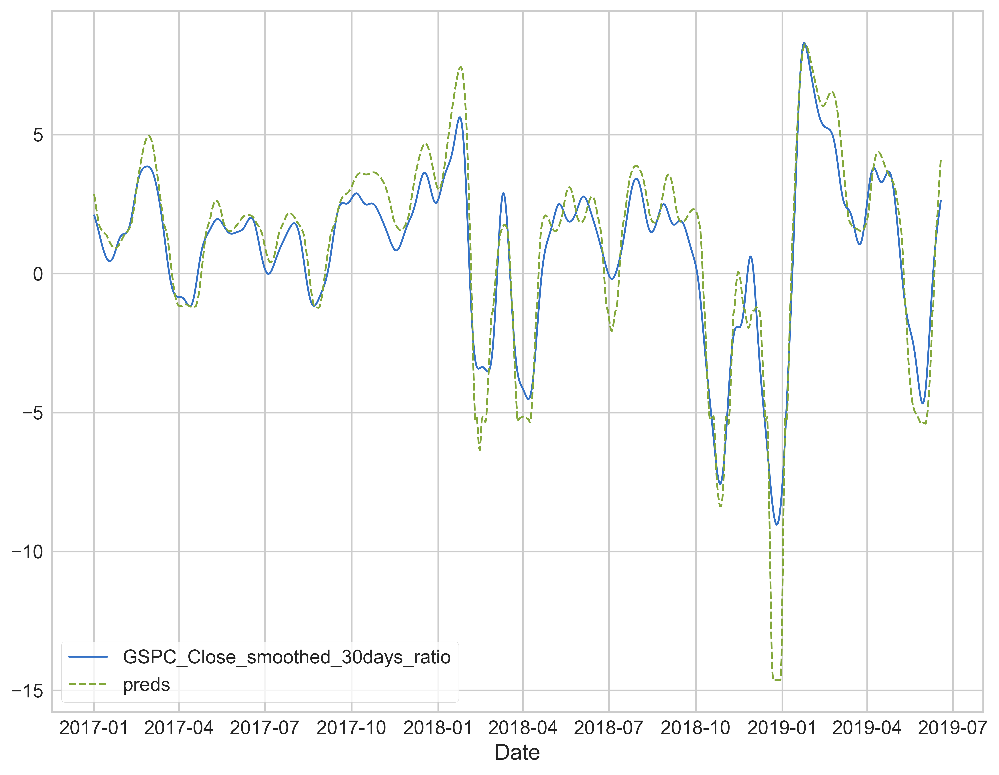

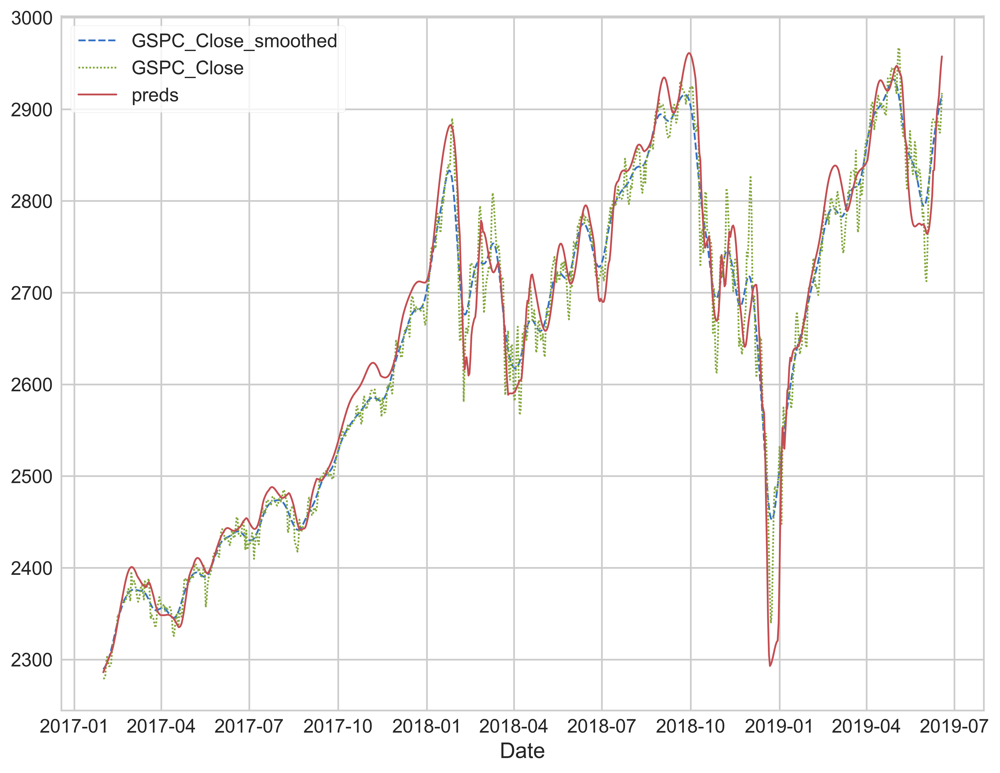

Prediction is -1.001152073732726 days behind reference


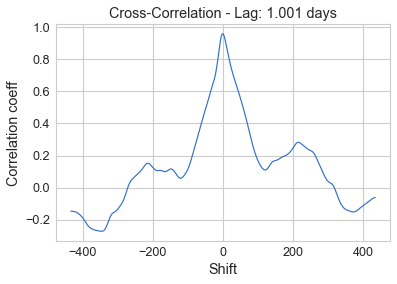


For major peaks in the index:

The average delay around the peaks are 3.0 days
The median delay around the peaks are 3.0 days


,Days Delayed
2017-02-28,0.0
2017-05-05,3.0
2017-06-06,1.0
2017-07-23,0.0
2017-11-04,1.0
2017-12-19,3.0
2018-01-24,1.0
2018-02-23,3.0
2018-03-10,6.0
2018-04-18,2.0


In [16]:
plot_results(mlp_sklearn_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
3/3 [==============================] - 0s 80ms/step - loss: 2.9794 - mae: 2.9794 - val_loss: 6.3047 - val_mae: 6.3047
Epoch 2/500
3/3 [==============================] - 0s 16ms/step - loss: 2.6118 - mae: 2.6118 - val_loss: 6.0792 - val_mae: 6.0792
Epoch 3/500
3/3 [==============================] - 0s 18ms/step - loss: 2.4144 - mae: 2.4144 - val_loss: 4.0813 - val_mae: 4.0813
Epoch 4/500
3/3 [==============================] - 0s 15ms/step - loss: 2.2925 - mae: 2.2925 - val_loss: 5.3482 - val_mae: 5.3482
Epoch 5/500
3/3 [==============================] - 0s 15ms/step - loss: 2.1562 - mae: 2.1562 - val_loss: 4.3158 - val_mae: 4.3158
Epoch 6/500
3/3 [==============================] - 0s 15ms/step - loss: 2.0758 - mae: 2.0758 - val_loss: 4.9426 - val_mae: 4.9426
Epoch 7/500
3/3 [==============================] - 0s 16ms/step - loss: 1.9883 - mae: 1.9883 - val_loss: 5.6550 - val_mae: 5.6550
Epoch 8/500
3/3 [==============================] - 0s 15ms/step - loss: 1.9193 - mae: 1.91

3/3 [==============================] - 0s 14ms/step - loss: 1.1328 - mae: 1.1328 - val_loss: 1.2330 - val_mae: 1.2330
Epoch 64/500
3/3 [==============================] - 0s 18ms/step - loss: 1.1094 - mae: 1.1094 - val_loss: 1.0830 - val_mae: 1.0830
Epoch 65/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1295 - mae: 1.1295 - val_loss: 1.1956 - val_mae: 1.1956
Epoch 66/500
3/3 [==============================] - 0s 17ms/step - loss: 1.1120 - mae: 1.1120 - val_loss: 1.1583 - val_mae: 1.1583
Epoch 67/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1001 - mae: 1.1001 - val_loss: 1.2395 - val_mae: 1.2395
Epoch 68/500
3/3 [==============================] - 0s 17ms/step - loss: 1.1012 - mae: 1.1012 - val_loss: 1.1856 - val_mae: 1.1856
Epoch 69/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1097 - mae: 1.1097 - val_loss: 1.1627 - val_mae: 1.1627
Epoch 70/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1032 - mae: 1.1032 - 

3/3 [==============================] - 0s 15ms/step - loss: 1.0040 - mae: 1.0040 - val_loss: 0.9176 - val_mae: 0.9176
Epoch 126/500
3/3 [==============================] - 0s 13ms/step - loss: 1.0098 - mae: 1.0098 - val_loss: 0.9243 - val_mae: 0.9243
Epoch 127/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9952 - mae: 0.9952 - val_loss: 0.9199 - val_mae: 0.9199
Epoch 128/500
3/3 [==============================] - 0s 15ms/step - loss: 0.9996 - mae: 0.9996 - val_loss: 0.9141 - val_mae: 0.9141
Epoch 129/500
3/3 [==============================] - 0s 14ms/step - loss: 1.0067 - mae: 1.0067 - val_loss: 1.0442 - val_mae: 1.0442
Epoch 130/500
3/3 [==============================] - 0s 13ms/step - loss: 0.9770 - mae: 0.9770 - val_loss: 0.9862 - val_mae: 0.9862
Epoch 131/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9719 - mae: 0.9719 - val_loss: 1.0141 - val_mae: 1.0141
Epoch 132/500
3/3 [==============================] - 0s 16ms/step - loss: 0.9711 - mae: 0.

3/3 [==============================] - 0s 14ms/step - loss: 0.9009 - mae: 0.9009 - val_loss: 0.9213 - val_mae: 0.9213
Epoch 188/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9051 - mae: 0.9051 - val_loss: 1.0116 - val_mae: 1.0116
Epoch 189/500
3/3 [==============================] - 0s 13ms/step - loss: 0.8888 - mae: 0.8888 - val_loss: 0.9761 - val_mae: 0.9761
Epoch 190/500
3/3 [==============================] - 0s 13ms/step - loss: 0.8919 - mae: 0.8919 - val_loss: 0.8857 - val_mae: 0.8857
Epoch 191/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8814 - mae: 0.8814 - val_loss: 0.9430 - val_mae: 0.9430
Epoch 192/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8846 - mae: 0.8846 - val_loss: 0.8749 - val_mae: 0.8749
Epoch 193/500
3/3 [==============================] - 0s 13ms/step - loss: 0.8772 - mae: 0.8772 - val_loss: 1.0421 - val_mae: 1.0421
Epoch 194/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8786 - mae: 0.

3/3 [==============================] - 0s 14ms/step - loss: 0.8197 - mae: 0.8197 - val_loss: 0.7568 - val_mae: 0.7568
Epoch 250/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8074 - mae: 0.8074 - val_loss: 0.7387 - val_mae: 0.7387
Epoch 251/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8220 - mae: 0.8220 - val_loss: 0.7677 - val_mae: 0.7677
Epoch 252/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8104 - mae: 0.8104 - val_loss: 0.7359 - val_mae: 0.7359
Epoch 253/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8089 - mae: 0.8089 - val_loss: 0.8206 - val_mae: 0.8206
Epoch 254/500
3/3 [==============================] - 0s 15ms/step - loss: 0.8016 - mae: 0.8016 - val_loss: 0.7105 - val_mae: 0.7105
Epoch 255/500
3/3 [==============================] - 0s 14ms/step - loss: 0.8063 - mae: 0.8063 - val_loss: 0.8692 - val_mae: 0.8692
Epoch 256/500
3/3 [==============================] - 0s 15ms/step - loss: 0.8253 - mae: 0.

3/3 [==============================] - 0s 14ms/step - loss: 0.7446 - mae: 0.7446 - val_loss: 0.7656 - val_mae: 0.7656
Epoch 312/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7654 - mae: 0.7654 - val_loss: 0.7359 - val_mae: 0.7359
Epoch 313/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7751 - mae: 0.7751 - val_loss: 0.7604 - val_mae: 0.7604
Epoch 314/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7591 - mae: 0.7591 - val_loss: 0.7952 - val_mae: 0.7952
Epoch 315/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7677 - mae: 0.7677 - val_loss: 0.7757 - val_mae: 0.7757
Epoch 316/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7543 - mae: 0.7543 - val_loss: 0.8001 - val_mae: 0.8001
Epoch 317/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7435 - mae: 0.7435 - val_loss: 0.7052 - val_mae: 0.7052
Epoch 318/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7427 - mae: 0.

3/3 [==============================] - 0s 13ms/step - loss: 0.7259 - mae: 0.7259 - val_loss: 0.6780 - val_mae: 0.6780
Epoch 374/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7180 - mae: 0.7180 - val_loss: 0.6664 - val_mae: 0.6664
Epoch 375/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7135 - mae: 0.7135 - val_loss: 0.7433 - val_mae: 0.7433
Epoch 376/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7194 - mae: 0.7194 - val_loss: 0.6985 - val_mae: 0.6985
Epoch 377/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7126 - mae: 0.7126 - val_loss: 0.7717 - val_mae: 0.7717
Epoch 378/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7135 - mae: 0.7135 - val_loss: 0.7073 - val_mae: 0.7073
Epoch 379/500
3/3 [==============================] - 0s 13ms/step - loss: 0.7065 - mae: 0.7065 - val_loss: 0.7507 - val_mae: 0.7507
Epoch 380/500
3/3 [==============================] - 0s 13ms/step - loss: 0.6999 - mae: 0.

3/3 [==============================] - 0s 13ms/step - loss: 0.6783 - mae: 0.6783 - val_loss: 0.6378 - val_mae: 0.6378
Epoch 436/500
3/3 [==============================] - 0s 14ms/step - loss: 0.6894 - mae: 0.6894 - val_loss: 0.6485 - val_mae: 0.6485
Epoch 437/500
3/3 [==============================] - 0s 13ms/step - loss: 0.6854 - mae: 0.6854 - val_loss: 0.6736 - val_mae: 0.6736
Epoch 438/500
3/3 [==============================] - 0s 13ms/step - loss: 0.6890 - mae: 0.6890 - val_loss: 0.6760 - val_mae: 0.6760
Epoch 439/500
3/3 [==============================] - 0s 15ms/step - loss: 0.6949 - mae: 0.6949 - val_loss: 0.6712 - val_mae: 0.6712
Epoch 440/500
3/3 [==============================] - 0s 14ms/step - loss: 0.6984 - mae: 0.6984 - val_loss: 0.6492 - val_mae: 0.6492
Epoch 441/500
3/3 [==============================] - 0s 14ms/step - loss: 0.7010 - mae: 0.7010 - val_loss: 0.6610 - val_mae: 0.6610
Epoch 442/500
3/3 [==============================] - 0s 13ms/step - loss: 0.6941 - mae: 0.

3/3 [==============================] - 0s 14ms/step - loss: 0.6552 - mae: 0.6552 - val_loss: 0.6359 - val_mae: 0.6359
Epoch 498/500
3/3 [==============================] - 0s 14ms/step - loss: 0.6649 - mae: 0.6649 - val_loss: 0.6615 - val_mae: 0.6615
Epoch 499/500
3/3 [==============================] - 0s 13ms/step - loss: 0.6641 - mae: 0.6641 - val_loss: 0.6514 - val_mae: 0.6514
Epoch 500/500
3/3 [==============================] - 0s 17ms/step - loss: 0.6826 - mae: 0.6826 - val_loss: 0.6571 - val_mae: 0.6571
Minimum Validation Loss: 0.5963
Model test accuracy: 2.979


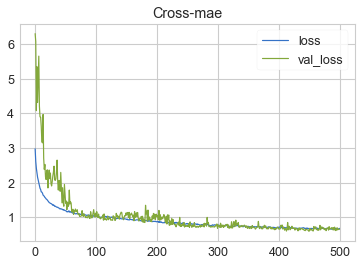

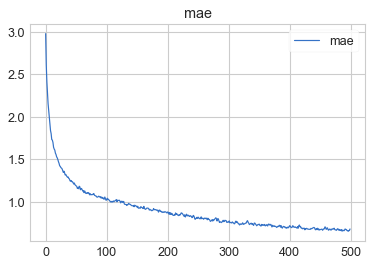

In [17]:
mlp_tf_model = keras.Sequential([
    layers.Dense(256, activation='relu',input_shape=[X_train.shape[1]]),   
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
])


# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),
#     layers.BatchNormalization(),
#     layers.Dense(64, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.BatchNormalization(),
#     layers.Dense(128, activation='relu'), 
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(1, activation='relu'),
# ])

# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(7, activation='relu'), 
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(1, activation='relu'),
# ])

mlp_tf_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=50,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = mlp_tf_model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    batch_size=365*10,
    epochs=500,
    callbacks=[early_stopping]
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
history_df.loc[:, ['mae']].plot(title="mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))
print(f'Model test accuracy: {history_df["mae"].max():.3f}')

The absolut error is 0.731%
19.48199193777112


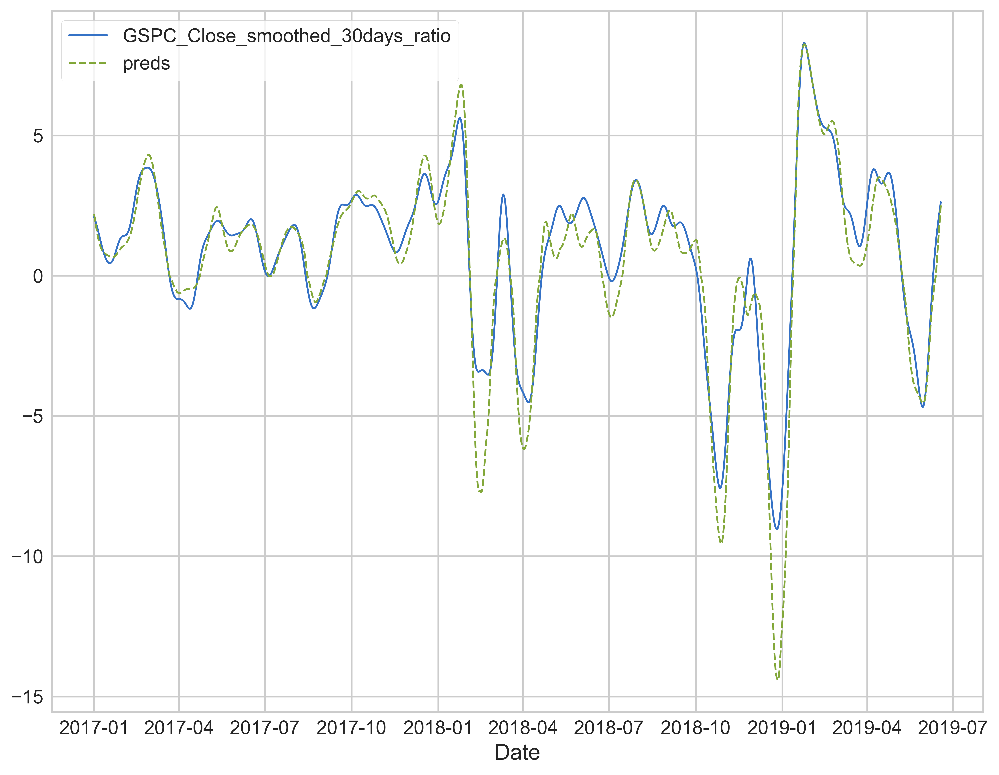

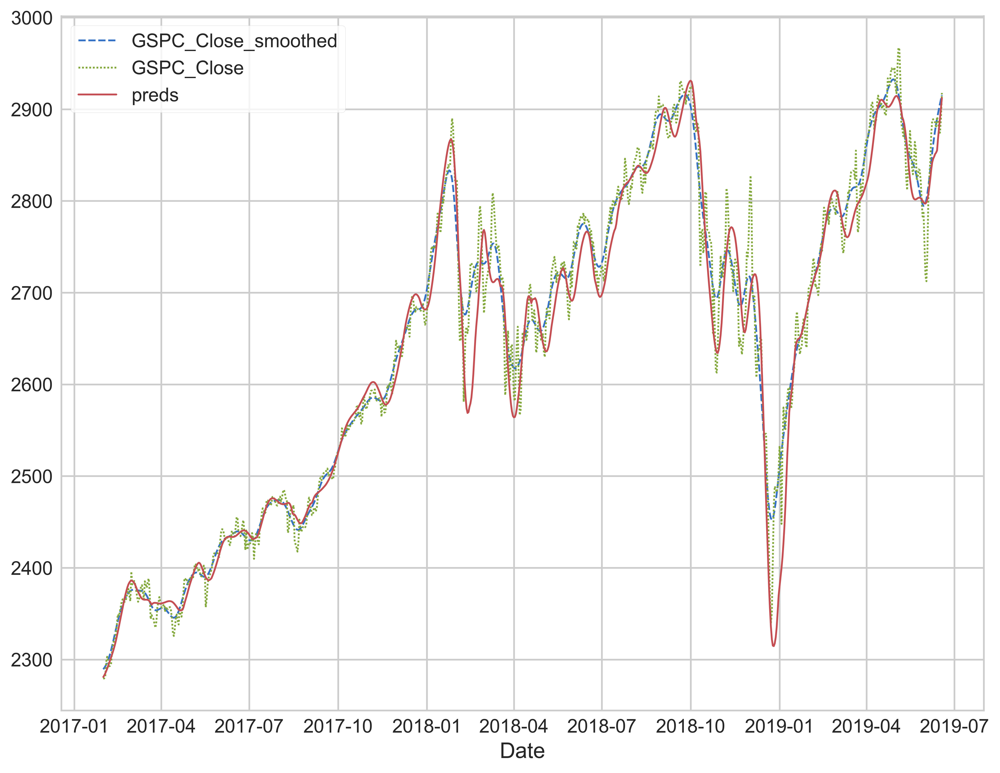

Prediction is -2.002304147465452 days behind reference


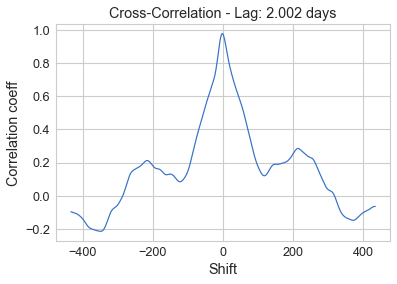


For major peaks in the index:

The average delay around the peaks are 2.833 days
The median delay around the peaks are 2.5 days


,Days Delayed
2017-02-28,0.0
2017-05-05,4.0
2017-06-06,2.0
2017-07-23,0.0
2017-11-04,1.0
2017-12-19,0.0
2018-01-24,2.0
2018-02-23,6.0
2018-04-18,-2.0
2018-05-16,6.0


In [18]:
plot_results(mlp_tf_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

In [19]:
def dnn_prepare(df, length):
    output=[]
    df_vals=df.values
    for i in range(length, df_vals.shape[0]):
        output.append(df_vals[i-length:i])
    output = np.array(output)

    return output

train_X_dnn = dnn_prepare(X_train,prediction_distance*2)
y_train_dnn = y_train[prediction_distance*2:]

valid_X_dnn = dnn_prepare(X_valid,prediction_distance*2)
y_valid_dnn = y_valid[prediction_distance*2:]

val_X_dnn = dnn_prepare(X_val,prediction_distance*2)
y_val_dnn = y_val[prediction_distance*2:]

test_X_dnn = dnn_prepare(X_test,prediction_distance*2)
y_test_dnn = y_test[prediction_distance*2:]

In [20]:
# lstm_prepare(X_train,60).shape

Epoch 1/2000
6/6 [==============================] - 0s 73ms/step - loss: 3.2753 - mae: 3.2753 - val_loss: 2.1736 - val_mae: 2.1736
Epoch 2/2000
6/6 [==============================] - 0s 22ms/step - loss: 3.1591 - mae: 3.1591 - val_loss: 2.1363 - val_mae: 2.1363
Epoch 3/2000
6/6 [==============================] - 0s 22ms/step - loss: 3.0900 - mae: 3.0900 - val_loss: 2.1083 - val_mae: 2.1083
Epoch 4/2000
6/6 [==============================] - 0s 22ms/step - loss: 3.0451 - mae: 3.0451 - val_loss: 2.0554 - val_mae: 2.0554
Epoch 5/2000
6/6 [==============================] - 0s 22ms/step - loss: 3.0087 - mae: 3.0087 - val_loss: 2.0259 - val_mae: 2.0259
Epoch 6/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.9898 - mae: 2.9898 - val_loss: 1.9785 - val_mae: 1.9785
Epoch 7/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.9651 - mae: 2.9651 - val_loss: 1.9739 - val_mae: 1.9739
Epoch 8/2000
6/6 [==============================] - 0s 21ms/step - loss: 2.9551 - m

6/6 [==============================] - 0s 23ms/step - loss: 2.7471 - mae: 2.7471 - val_loss: 1.7736 - val_mae: 1.7736
Epoch 64/2000
6/6 [==============================] - 0s 24ms/step - loss: 2.7370 - mae: 2.7370 - val_loss: 1.7308 - val_mae: 1.7308
Epoch 65/2000
6/6 [==============================] - 0s 26ms/step - loss: 2.7469 - mae: 2.7469 - val_loss: 1.7168 - val_mae: 1.7168
Epoch 66/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.7737 - mae: 2.7737 - val_loss: 1.8045 - val_mae: 1.8045
Epoch 67/2000
6/6 [==============================] - 0s 21ms/step - loss: 2.7761 - mae: 2.7761 - val_loss: 1.7372 - val_mae: 1.7372
Epoch 68/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.7425 - mae: 2.7425 - val_loss: 1.6802 - val_mae: 1.6802
Epoch 69/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.7246 - mae: 2.7246 - val_loss: 1.6839 - val_mae: 1.6839
Epoch 70/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.7071 - mae: 2.

Epoch 125/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.2962 - mae: 2.2962 - val_loss: 1.3987 - val_mae: 1.3987
Epoch 126/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.2922 - mae: 2.2922 - val_loss: 1.3250 - val_mae: 1.3250
Epoch 127/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.2965 - mae: 2.2965 - val_loss: 1.4790 - val_mae: 1.4790
Epoch 128/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.3073 - mae: 2.3073 - val_loss: 1.3467 - val_mae: 1.3467
Epoch 129/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.2907 - mae: 2.2907 - val_loss: 1.3411 - val_mae: 1.3411
Epoch 130/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.3257 - mae: 2.3257 - val_loss: 1.3650 - val_mae: 1.3650
Epoch 131/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.3386 - mae: 2.3386 - val_loss: 1.3200 - val_mae: 1.3200
Epoch 132/2000
6/6 [==============================] - 0s 22ms/step - 

6/6 [==============================] - 0s 22ms/step - loss: 2.0117 - mae: 2.0117 - val_loss: 1.1957 - val_mae: 1.1957
Epoch 187/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.0124 - mae: 2.0124 - val_loss: 1.1451 - val_mae: 1.1451
Epoch 188/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.0374 - mae: 2.0374 - val_loss: 1.1752 - val_mae: 1.1752
Epoch 189/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.0433 - mae: 2.0433 - val_loss: 1.3688 - val_mae: 1.3688
Epoch 190/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.1192 - mae: 2.1192 - val_loss: 1.1816 - val_mae: 1.1816
Epoch 191/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.1862 - mae: 2.1862 - val_loss: 1.1867 - val_mae: 1.1867
Epoch 192/2000
6/6 [==============================] - 0s 23ms/step - loss: 2.1417 - mae: 2.1417 - val_loss: 1.2276 - val_mae: 1.2276
Epoch 193/2000
6/6 [==============================] - 0s 22ms/step - loss: 2.0273 - 

Epoch 248/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8464 - mae: 1.8464 - val_loss: 1.1271 - val_mae: 1.1271
Epoch 249/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8346 - mae: 1.8346 - val_loss: 1.1093 - val_mae: 1.1093
Epoch 250/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8379 - mae: 1.8379 - val_loss: 1.1977 - val_mae: 1.1977
Epoch 251/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8345 - mae: 1.8345 - val_loss: 1.1168 - val_mae: 1.1168
Epoch 252/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8471 - mae: 1.8471 - val_loss: 1.1355 - val_mae: 1.1355
Epoch 253/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8492 - mae: 1.8492 - val_loss: 1.0481 - val_mae: 1.0481
Epoch 254/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.8113 - mae: 1.8113 - val_loss: 1.0717 - val_mae: 1.0717
Epoch 255/2000
6/6 [==============================] - 0s 22ms/step - 

6/6 [==============================] - 0s 22ms/step - loss: 1.8003 - mae: 1.8003 - val_loss: 1.2091 - val_mae: 1.2091
Epoch 310/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.7938 - mae: 1.7938 - val_loss: 1.0382 - val_mae: 1.0382
Epoch 311/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.7567 - mae: 1.7567 - val_loss: 0.9954 - val_mae: 0.9954
Epoch 312/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.7334 - mae: 1.7334 - val_loss: 1.1891 - val_mae: 1.1891
Epoch 313/2000
6/6 [==============================] - 0s 25ms/step - loss: 1.7453 - mae: 1.7453 - val_loss: 1.0091 - val_mae: 1.0091
Epoch 314/2000
6/6 [==============================] - 0s 27ms/step - loss: 1.7186 - mae: 1.7186 - val_loss: 1.0188 - val_mae: 1.0188
Epoch 315/2000
6/6 [==============================] - 0s 28ms/step - loss: 1.7464 - mae: 1.7464 - val_loss: 1.0796 - val_mae: 1.0796
Epoch 316/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.7520 - 

Epoch 371/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.6709 - mae: 1.6709 - val_loss: 1.0581 - val_mae: 1.0581
Epoch 372/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.6598 - mae: 1.6598 - val_loss: 1.0065 - val_mae: 1.0065
Epoch 373/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.6653 - mae: 1.6653 - val_loss: 1.0654 - val_mae: 1.0654
Epoch 374/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.6588 - mae: 1.6588 - val_loss: 1.1243 - val_mae: 1.1243
Epoch 375/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.6848 - mae: 1.6848 - val_loss: 1.0555 - val_mae: 1.0555
Epoch 376/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.6927 - mae: 1.6927 - val_loss: 1.0973 - val_mae: 1.0973
Epoch 377/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.6921 - mae: 1.6921 - val_loss: 1.1061 - val_mae: 1.1061
Epoch 378/2000
6/6 [==============================] - 0s 22ms/step - 

6/6 [==============================] - 0s 22ms/step - loss: 1.6409 - mae: 1.6409 - val_loss: 0.9914 - val_mae: 0.9914
Epoch 433/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5817 - mae: 1.5817 - val_loss: 1.0327 - val_mae: 1.0327
Epoch 434/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.6595 - mae: 1.6595 - val_loss: 1.0700 - val_mae: 1.0700
Epoch 435/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.6109 - mae: 1.6109 - val_loss: 1.0411 - val_mae: 1.0411
Epoch 436/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5611 - mae: 1.5611 - val_loss: 1.0768 - val_mae: 1.0768
Epoch 437/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5750 - mae: 1.5750 - val_loss: 1.0904 - val_mae: 1.0904
Epoch 438/2000
6/6 [==============================] - 0s 21ms/step - loss: 1.5745 - mae: 1.5745 - val_loss: 1.0057 - val_mae: 1.0057
Epoch 439/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5912 - 

Epoch 494/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4973 - mae: 1.4973 - val_loss: 1.2152 - val_mae: 1.2152
Epoch 495/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5453 - mae: 1.5453 - val_loss: 1.0815 - val_mae: 1.0815
Epoch 496/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4769 - mae: 1.4769 - val_loss: 1.0419 - val_mae: 1.0419
Epoch 497/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4709 - mae: 1.4709 - val_loss: 1.0121 - val_mae: 1.0121
Epoch 498/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4947 - mae: 1.4947 - val_loss: 0.9787 - val_mae: 0.9787
Epoch 499/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5227 - mae: 1.5227 - val_loss: 0.9660 - val_mae: 0.9660
Epoch 500/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5061 - mae: 1.5061 - val_loss: 1.0432 - val_mae: 1.0432
Epoch 501/2000
6/6 [==============================] - 0s 21ms/step - 

6/6 [==============================] - 0s 24ms/step - loss: 1.4740 - mae: 1.4740 - val_loss: 1.0956 - val_mae: 1.0956
Epoch 556/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.4930 - mae: 1.4930 - val_loss: 0.9743 - val_mae: 0.9743
Epoch 557/2000
6/6 [==============================] - 0s 23ms/step - loss: 1.4752 - mae: 1.4752 - val_loss: 1.0684 - val_mae: 1.0684
Epoch 558/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.5087 - mae: 1.5087 - val_loss: 1.0673 - val_mae: 1.0673
Epoch 559/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4521 - mae: 1.4521 - val_loss: 1.0401 - val_mae: 1.0401
Epoch 560/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4553 - mae: 1.4553 - val_loss: 0.9522 - val_mae: 0.9522
Epoch 561/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4832 - mae: 1.4832 - val_loss: 0.9679 - val_mae: 0.9679
Epoch 562/2000
6/6 [==============================] - 0s 22ms/step - loss: 1.4779 - 

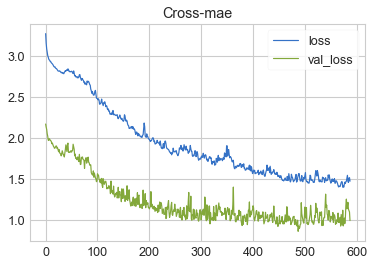

In [21]:


# design network
LSTM_model = keras.Sequential([
    # Note: wider LSTM would improve the result, but I'm often hardware constrained   
    layers.LSTM(64, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
#     layers.BatchNormalization(),
#     layers.Dropout(0.3),
#     layers.Dense(128),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(256),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(256),     
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
    layers.Dense(1),
#     layers.LeakyReLU(),
])

# LSTM_model = keras.Sequential([
#     layers.LSTM(32, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
#     layers.BatchNormalization(),
#     layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
# #     layers.Dense(256),     
# #     layers.BatchNormalization(),
# #     layers.LeakyReLU(),
#     layers.Dense(1),
#     layers.LeakyReLU(),
# ])

LSTM_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)
early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = LSTM_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=2000,
    callbacks=[early_stopping]
)

# plot history
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))




In [22]:
lstm_preds=LSTM_model.predict(test_X_dnn)
lstm_score = mean_absolute_error(y_test_dnn, lstm_preds)
print(f"Test mae = {round(lstm_score,4)}")

Test mae = 1.0153


The absolut error is 1.081%
28.753575146602905


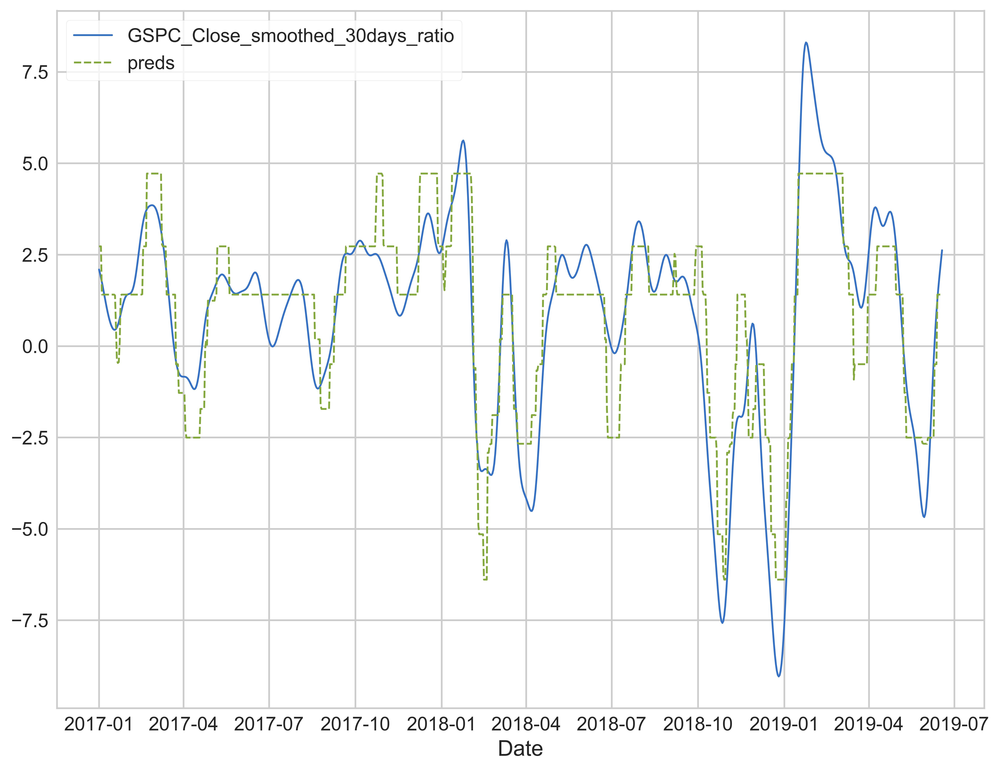

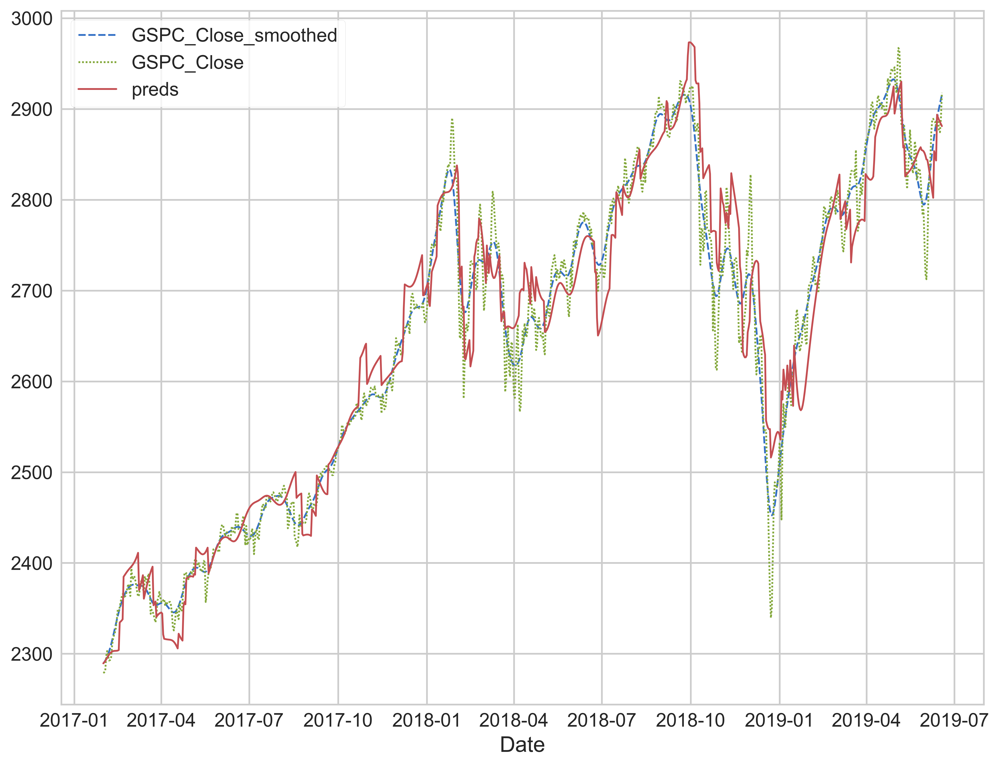

Prediction is -4.004608294930904 days behind reference


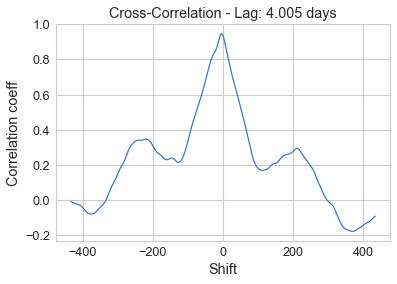


For major peaks in the index:

The average delay around the peaks are 3.0 days
The median delay around the peaks are 4.0 days


,Days Delayed
2017-02-28,8.0
2017-05-05,2.0
2017-06-06,-2.0
2017-07-23,-17.0
2017-11-04,-5.0
2017-12-19,8.0
2018-01-24,8.0
2018-02-23,1.0
2018-03-10,7.0
2018-04-18,-6.0


In [23]:
plot_results(LSTM_model,test_X_dnn, y_test_dnn, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
6/6 [==============================] - 0s 53ms/step - loss: 2.9723 - mae: 2.9723 - val_loss: 9.1808 - val_mae: 9.1808
Epoch 2/500
6/6 [==============================] - 0s 23ms/step - loss: 2.6259 - mae: 2.6259 - val_loss: 4.1796 - val_mae: 4.1796
Epoch 3/500
6/6 [==============================] - 0s 23ms/step - loss: 2.3804 - mae: 2.3804 - val_loss: 4.6520 - val_mae: 4.6520
Epoch 4/500
6/6 [==============================] - 0s 21ms/step - loss: 2.1887 - mae: 2.1887 - val_loss: 7.6539 - val_mae: 7.6539
Epoch 5/500
6/6 [==============================] - 0s 20ms/step - loss: 2.0602 - mae: 2.0602 - val_loss: 5.5425 - val_mae: 5.5425
Epoch 6/500
6/6 [==============================] - 0s 20ms/step - loss: 1.9861 - mae: 1.9861 - val_loss: 6.8261 - val_mae: 6.8261
Epoch 7/500
6/6 [==============================] - 0s 20ms/step - loss: 1.8750 - mae: 1.8750 - val_loss: 9.6010 - val_mae: 9.6010
Epoch 8/500
6/6 [==============================] - 0s 20ms/step - loss: 1.8010 - mae: 1.80

Epoch 62/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9441 - mae: 0.9441 - val_loss: 1.5514 - val_mae: 1.5514
Epoch 63/500
6/6 [==============================] - 0s 21ms/step - loss: 0.9400 - mae: 0.9400 - val_loss: 0.8601 - val_mae: 0.8601
Epoch 64/500
6/6 [==============================] - 0s 21ms/step - loss: 0.9388 - mae: 0.9388 - val_loss: 0.8172 - val_mae: 0.8172
Epoch 65/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8921 - mae: 0.8921 - val_loss: 0.9911 - val_mae: 0.9911
Epoch 66/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9026 - mae: 0.9026 - val_loss: 1.0633 - val_mae: 1.0633
Epoch 67/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9647 - mae: 0.9647 - val_loss: 0.7284 - val_mae: 0.7284
Epoch 68/500
6/6 [==============================] - 0s 21ms/step - loss: 0.9372 - mae: 0.9372 - val_loss: 0.6532 - val_mae: 0.6532
Epoch 69/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9324 - m

6/6 [==============================] - 0s 20ms/step - loss: 0.8319 - mae: 0.8319 - val_loss: 0.9597 - val_mae: 0.9597
Epoch 125/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8346 - mae: 0.8346 - val_loss: 0.4509 - val_mae: 0.4509
Epoch 126/500
6/6 [==============================] - 0s 21ms/step - loss: 0.7962 - mae: 0.7962 - val_loss: 0.4291 - val_mae: 0.4291
Epoch 127/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8767 - mae: 0.8767 - val_loss: 0.6661 - val_mae: 0.6661
Epoch 128/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8565 - mae: 0.8565 - val_loss: 0.5011 - val_mae: 0.5011
Epoch 129/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8524 - mae: 0.8524 - val_loss: 0.4221 - val_mae: 0.4221
Epoch 130/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8184 - mae: 0.8184 - val_loss: 0.5009 - val_mae: 0.5009
Epoch 131/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7774 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.7213 - mae: 0.7213 - val_loss: 0.3228 - val_mae: 0.3228
Epoch 187/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7356 - mae: 0.7356 - val_loss: 0.4429 - val_mae: 0.4429
Epoch 188/500
6/6 [==============================] - 0s 21ms/step - loss: 0.7454 - mae: 0.7454 - val_loss: 0.9169 - val_mae: 0.9169
Epoch 189/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7068 - mae: 0.7068 - val_loss: 0.7932 - val_mae: 0.7932
Epoch 190/500
6/6 [==============================] - 0s 23ms/step - loss: 0.7184 - mae: 0.7184 - val_loss: 1.1609 - val_mae: 1.1609
Epoch 191/500
6/6 [==============================] - 0s 21ms/step - loss: 0.7488 - mae: 0.7488 - val_loss: 0.9035 - val_mae: 0.9035
Epoch 192/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7574 - mae: 0.7574 - val_loss: 0.5602 - val_mae: 0.5602
Epoch 193/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7463 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.7857 - mae: 0.7857 - val_loss: 0.5460 - val_mae: 0.5460
Epoch 249/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7128 - mae: 0.7128 - val_loss: 0.5697 - val_mae: 0.5697
Epoch 250/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6850 - mae: 0.6850 - val_loss: 0.3846 - val_mae: 0.3846
Epoch 251/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6841 - mae: 0.6841 - val_loss: 1.3890 - val_mae: 1.3890
Epoch 252/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6908 - mae: 0.6908 - val_loss: 0.4380 - val_mae: 0.4380
Epoch 253/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6709 - mae: 0.6709 - val_loss: 0.3567 - val_mae: 0.3567
Epoch 254/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6828 - mae: 0.6828 - val_loss: 0.4519 - val_mae: 0.4519
Epoch 255/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6611 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.6358 - mae: 0.6358 - val_loss: 0.9137 - val_mae: 0.9137
Epoch 311/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6644 - mae: 0.6644 - val_loss: 0.4485 - val_mae: 0.4485
Epoch 312/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6500 - mae: 0.6500 - val_loss: 1.0307 - val_mae: 1.0307
Epoch 313/500
6/6 [==============================] - 0s 22ms/step - loss: 0.6292 - mae: 0.6292 - val_loss: 0.6116 - val_mae: 0.6116
Minimum Validation Loss: 0.2873


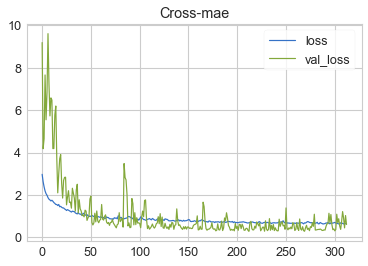

In [28]:
# design network

cnn_model = keras.Sequential([
    layers.Conv1D(filters=64, kernel_size=int(prediction_distance/2), activation='relu', input_shape=(train_X_dnn.shape[1],train_X_dnn.shape[2])), 
    layers.MaxPooling1D(pool_size=2),
    layers.Flatten(),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
    layers.Dense(32),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
]) #0.6251


cnn_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)

early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.00005,
    restore_best_weights=True,
)

cnn_history = cnn_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=500,
    callbacks=[early_stopping]
)

# plot history
cnn_history_df = pd.DataFrame(cnn_history.history)
cnn_history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")

print(("Minimum Validation Loss: {:0.4f}").format(cnn_history_df['val_loss'].min()))


In [29]:
cnn_preds=cnn_model.predict(test_X_dnn)
cnn_score = mean_absolute_error(y_test_dnn, cnn_preds)
print(f"Test mae = {round(cnn_score,4)}")

Test mae = 0.4369


The absolut error is 0.512%
13.68959065546399


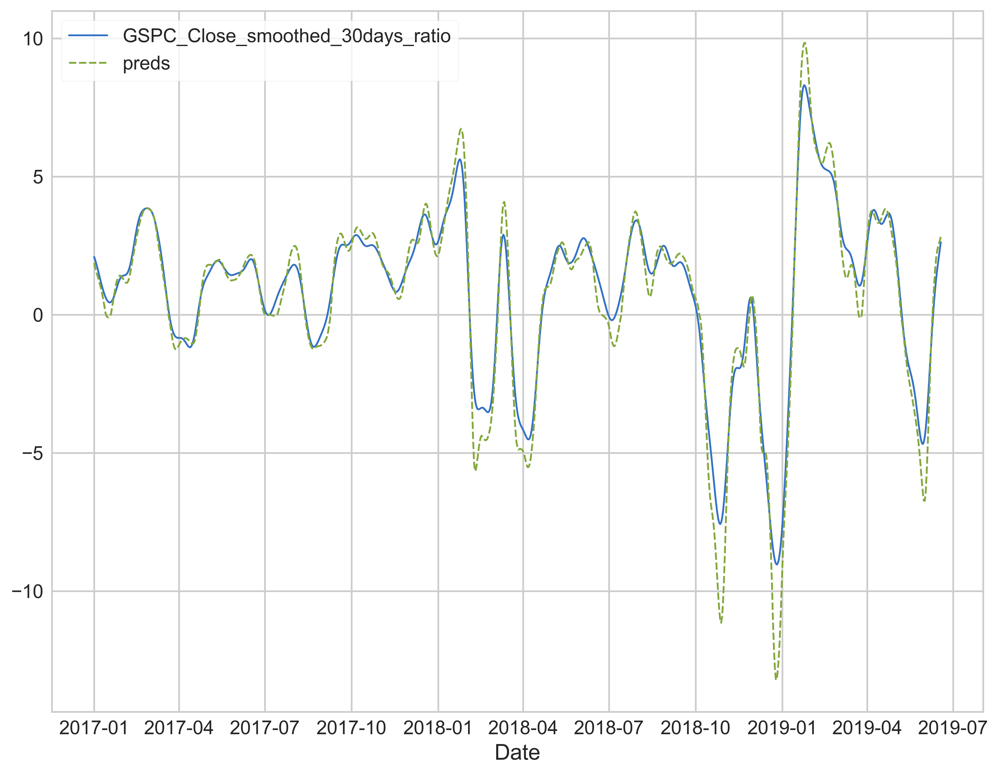

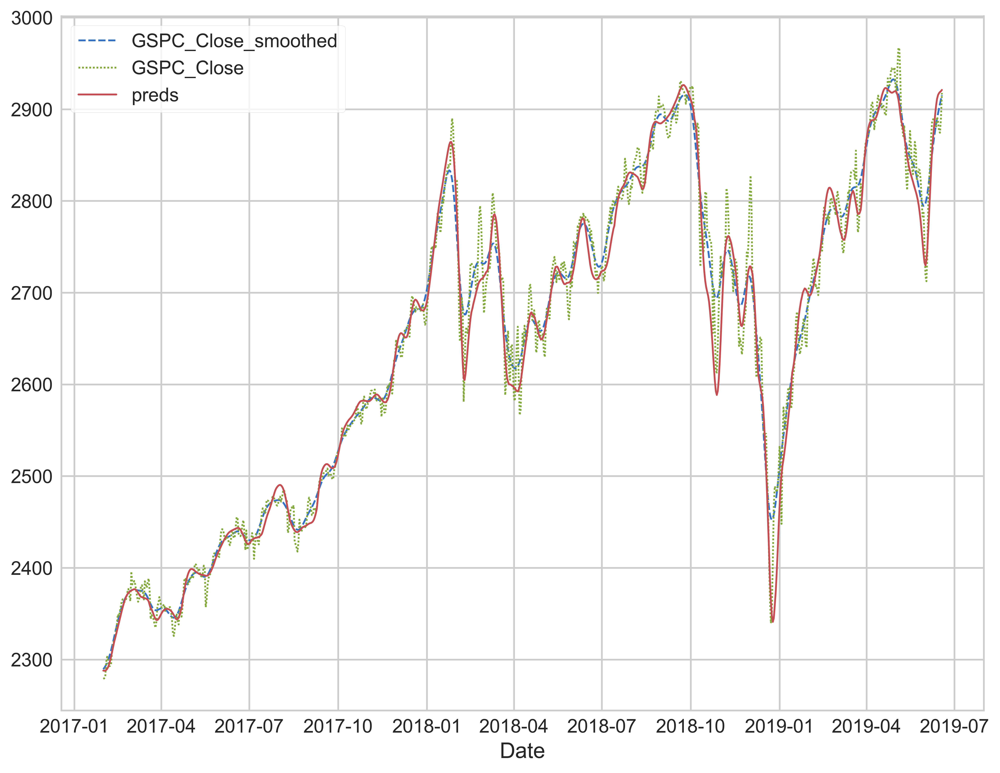

Prediction is 0.0 days behind reference


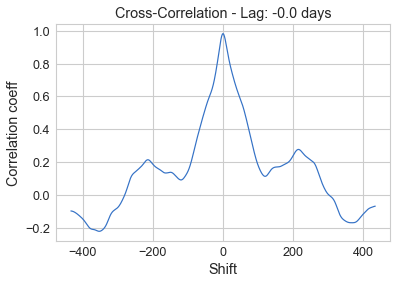


For major peaks in the index:

The average delay around the peaks are -0.158 days
The median delay around the peaks are 0.0 days


,Days Delayed
2017-02-28,0.0
2017-05-05,-4.0
2017-06-06,5.0
2017-07-23,9.0
2017-11-04,5.0
2017-12-19,1.0
2018-01-24,1.0
2018-03-10,2.0
2018-04-18,1.0
2018-05-16,-1.0


In [30]:
plot_results(cnn_model,test_X_dnn, y_test_dnn)